In [1]:
import os
import gc
import json
import torch
import hydra
from omegaconf import OmegaConf
from collections import OrderedDict
from PIL import Image

In [2]:
mllm_config = OmegaConf.load("configs/clm_models/llm_qwen25_vl_3b_lora.yaml")
got_model_config = OmegaConf.load("configs/clm_models/agent_got.yaml")

In [3]:
weight_dtype = torch.bfloat16

In [ ]:
mllm_model = hydra.utils.instantiate(mllm_config, torch_dtype='bf16')
mllm_model.config.use_cache = True
mllm_model = mllm_model.eval()

In [ ]:
got_model = hydra.utils.instantiate(got_model_config, mllm=mllm_model)
got_model = got_model.to(weight_dtype).cuda()
got_model = got_model.eval()

In [6]:
def load_sharded_checkpoint(folder_path):
    """
    Loads all shard files for a model based on the `pytorch_model.bin.index.json` file
    and returns an OrderedDict containing all model parameters.

    Args:
        folder_path (str): The folder containing the `.bin` files and the `pytorch_model.bin.index.json`.

    Returns:
        OrderedDict: A consolidated OrderedDict of all model parameters.
    """
    # Step 1: Locate the index file
    index_file = os.path.join(folder_path, "pytorch_model.bin.index.json")
    if not os.path.exists(index_file):
        raise FileNotFoundError(f"Index file not found in the directory: {index_file}")

    # Step 2: Load the index file
    with open(index_file, "r") as f:
        index_data = json.load(f)

    # Ensure the "weight_map" key exists in the index file
    if "weight_map" not in index_data:
        raise ValueError("Invalid index file format: 'weight_map' key not found.")

    # Step 3: Parse the weight mapping
    weight_map = index_data["weight_map"]  # Maps parameter names to shard files
    shard_files = sorted(set(weight_map.values()))  # Get unique shard file names

    # Step 4: Verify all shard files exist
    shard_file_paths = [os.path.join(folder_path, shard_file) for shard_file in shard_files]
    for shard_file in shard_file_paths:
        if not os.path.exists(shard_file):
            raise FileNotFoundError(f"Shard file missing: {shard_file}")

    # Step 5: Load the shards and consolidate the state dictionary
    consolidated_state_dict = OrderedDict()
    for shard_file in shard_file_paths:
        print(f"Loading shard: {shard_file}")
        shard_state_dict = torch.load(shard_file, map_location="cpu")
        for param_name, param_value in shard_state_dict.items():
            # Ensure we only load parameters listed in the index file
            if param_name in weight_map:
                consolidated_state_dict[param_name] = param_value.to(torch.bfloat16)
        
        del shard_state_dict
        torch.cuda.empty_cache()
        gc.collect()


    # Step 6: Return the consolidated OrderedDict
    print("All shards loaded and parameters consolidated.")
    return consolidated_state_dict

In [ ]:
model_path = "pretrained/GoT-6B"
ckpt = load_sharded_checkpoint(model_path)
logs = got_model.load_state_dict(ckpt, strict=False)
print(logs)

# Text-to-image Generation

In [8]:
guidance_scale = 5.0
image_guidance_scale = 1.0
cond_image_guidance_scale = 4.0

In [9]:
caption = "A picturesque log cabin sits nestled among snow-covered trees and rocky shores at Lake Tahoe."

In [10]:
outputs = got_model.generate(text_input=caption, 
                             guidance_scale=guidance_scale,
                             image_guidance_scale=image_guidance_scale,
                             cond_image_guidance_scale=cond_image_guidance_scale,
                             prompt_type='t2i')

100%|██████████| 50/50 [00:18<00:00,  2.77it/s]


In [11]:
print(outputs['got_text'])

A serene winter scene unfolds at Lake Tahoe, featuring a rustic log cabin <|box_start|>(325,409),(687,612)<|box_end|> (red) nestled amidst snow-covered evergreen trees <|box_start|>(0,0),(998,626)<|box_end|> (blue). The cabin, with its dark brown wooden exterior and a sloping roof blanketed in fresh snow, stands prominently on a rocky shoreline <|box_start|>(0,600),(998,998)<|box_end|> (green). The surrounding landscape is a mix of rugged, snow-laden boulders and smooth, icy patches, creating a stark contrast against the deep blue water of the lake. The sky above is overcast, casting a soft, diffused light that enhances the tranquil atmosphere. The composition captures the harmonious blend of natural elements, with the cabin serving as a focal point amidst the expansive, wintry wilderness.<|im_gen_start|>


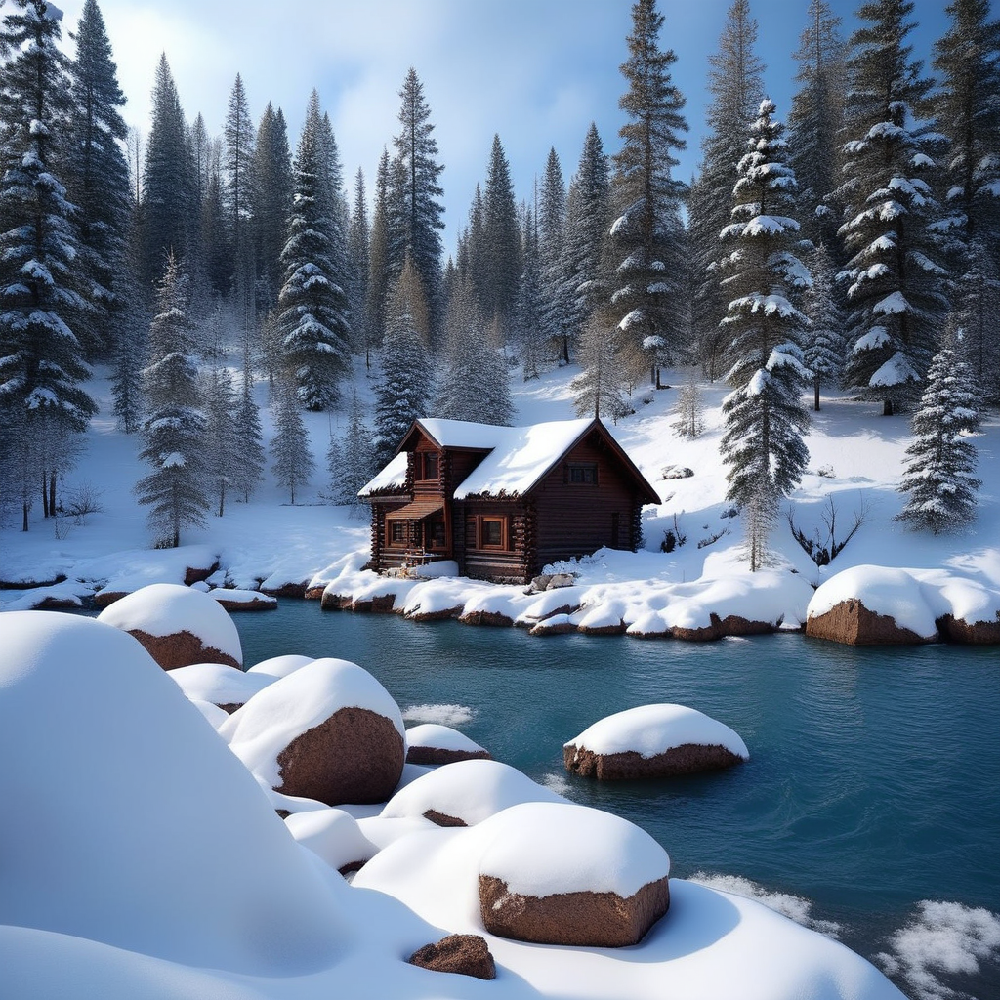

In [12]:
outputs['images'][0]

In [13]:
caption = "A modern living room with a touch of shabby chic, featuring white furniture, a chandelier, and decorative elements like mirrors and a wreath."

In [14]:
outputs = got_model.generate(text_input=caption, 
                             guidance_scale=guidance_scale,
                             image_guidance_scale=image_guidance_scale,
                             cond_image_guidance_scale=cond_image_guidance_scale,
                             prompt_type='t2i')

100%|██████████| 50/50 [00:18<00:00,  2.76it/s]


In [15]:
print(outputs['got_text'])

The image showcases a beautifully curated living room <|box_start|>(0,0),(998,998)<|box_end|> (red) that seamlessly blends modern and shabby chic aesthetics. The space features a harmonious color palette dominated by soft whites and creams, creating a serene and inviting atmosphere. A large, plush white sofa adorned with neutral-toned throw pillows sits centrally, flanked by two matching armchairs with cream cushions. A round, textured ottoman rests in front of the sofa, adding a touch of rustic charm. The coffee table, positioned between the seating area, holds a vase of delicate flowers and a stack of books, enhancing the room's cozy ambiance. Above the sofa hangs a chandelier <|box_start|>(427,0),(613,251)<|box_end|> (blue) with multiple arms, casting a warm glow over the space. To the left, a tall potted plant adds a natural element, while a smaller greenery arrangement sits on a side table near the window. The window itself is dressed with sheer curtains, allowing soft light to fi

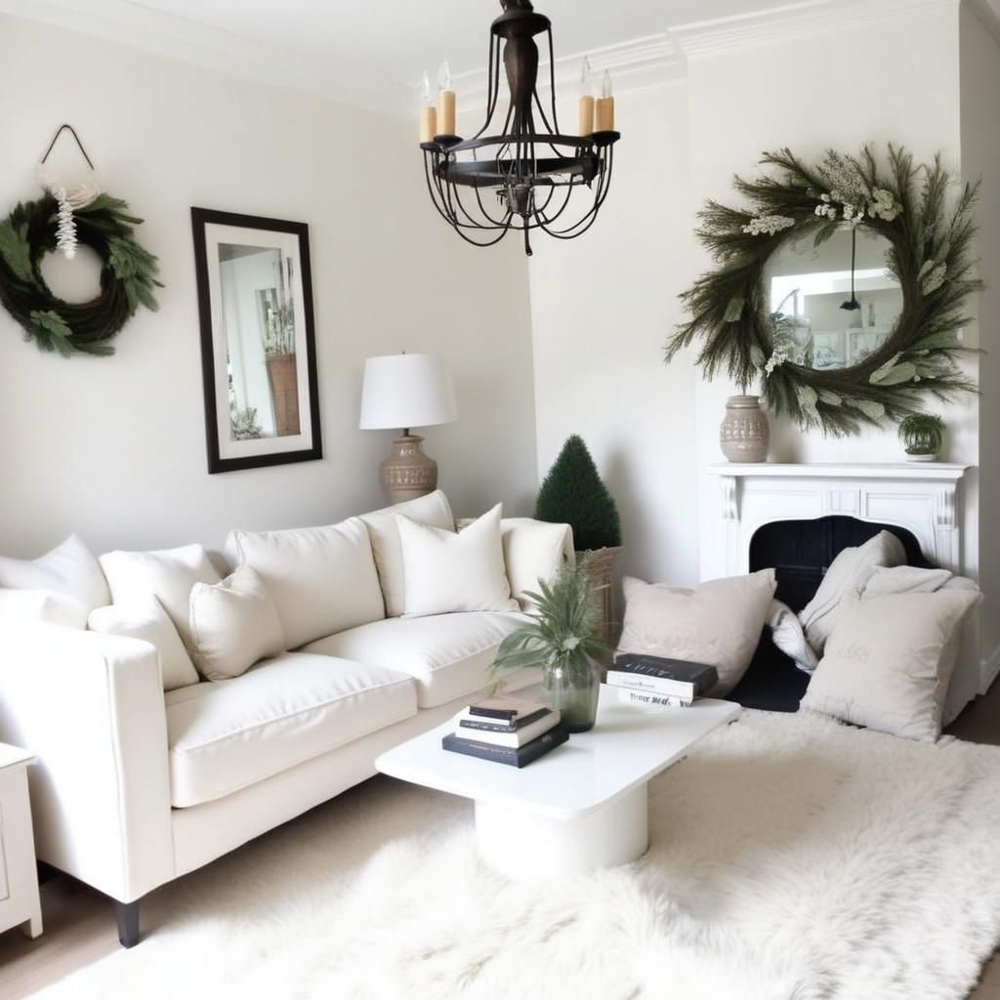

In [16]:
outputs['images'][0]

In [17]:
caption = "A Bloody Mary cocktail with a lemon garnish sits on a table with a tray of bread, in front of a cozy fireplace."

In [18]:
outputs = got_model.generate(text_input=caption, 
                             guidance_scale=guidance_scale,
                             image_guidance_scale=image_guidance_scale,
                             cond_image_guidance_scale=cond_image_guidance_scale,
                             prompt_type='t2i')

100%|██████████| 50/50 [00:18<00:00,  2.75it/s]


In [19]:
print(outputs['got_text'])

A vibrant Bloody Mary cocktail <|box_start|>(361,409),(627,856)<|box_end|> (red) sits prominently in the foreground, its rich red liquid filled with ice cubes and garnished with a slice of lemon <|box_start|>(540,325),(730,466)<|box_end|> (blue). The glass is positioned on a dark wooden tray <|box_start|>(10,750),(999,998)<|box_end|> (green), which also holds a small pile of golden-brown bread slices <|box_start|>(10,687),(462,896)<|box_end|> (purple). In the background, a warm, inviting fireplace <|box_start|>(0,0),(997,760)<|box_end|> (cyan) crackles with flames, casting a cozy glow over the scene. To the right, a wooden chair with a cushioned seat adds to the rustic ambiance. The overall composition balances the bold colors of the drink against the earthy tones of the wood and the soft light from the fire, creating a visually appealing and inviting setting.<|im_gen_start|>


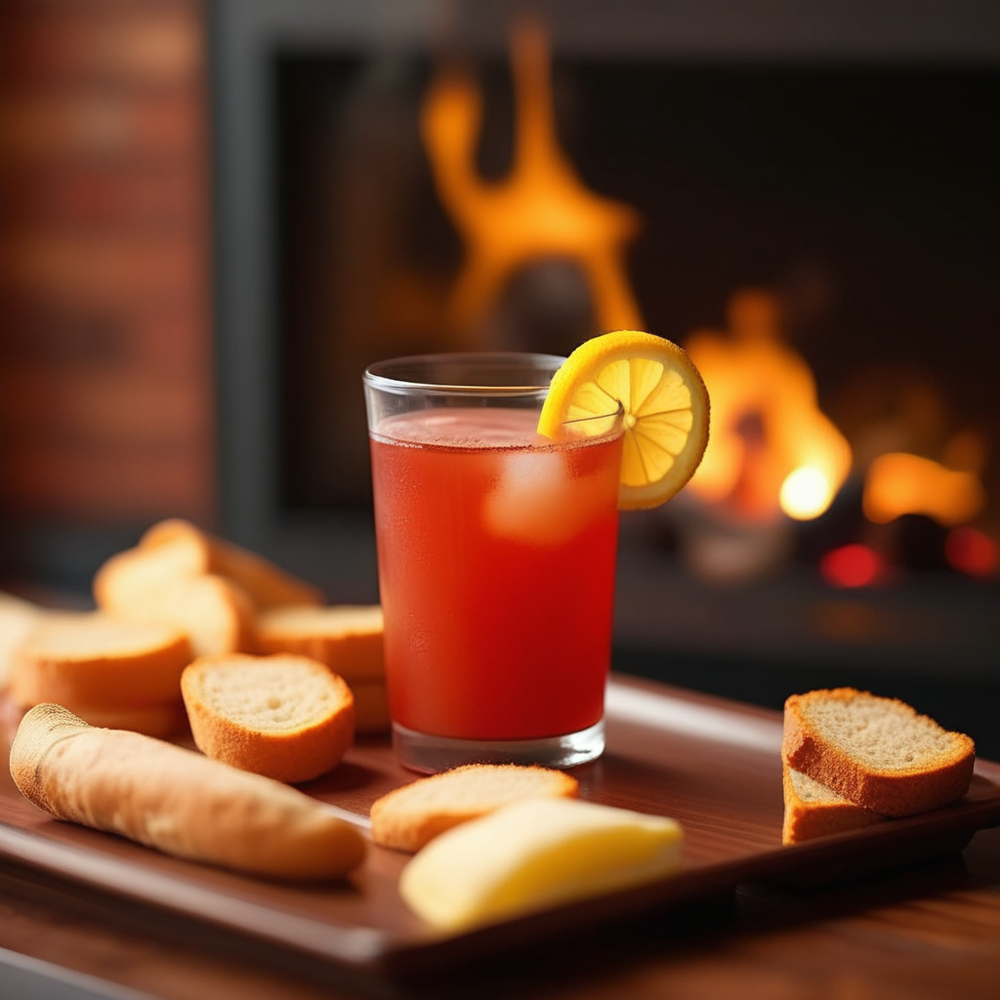

In [20]:
outputs['images'][0]

In [21]:
caption = "A photo of a wood chair on the left of an orange snowboard on a snowy mountain."

In [22]:
outputs = got_model.generate(text_input=caption, 
                             guidance_scale=guidance_scale,
                             image_guidance_scale=image_guidance_scale,
                             cond_image_guidance_scale=cond_image_guidance_scale,
                             prompt_type='t2i')

100%|██████████| 50/50 [00:18<00:00,  2.75it/s]


In [23]:
print(outputs['got_text'])

In a serene winter landscape, a vibrant orange snowboard <|box_start|>(423,109),(578,865)<|box_end|> (red) stands upright in the snow, its bright color contrasting sharply with the pristine white surroundings. To the left of the snowboard, a wooden chair <|box_start|>(159,485),(398,887)<|box_end|> (blue) with a simple design and a light brown finish rests on the snow, its slatted back and seat providing a stark contrast to the smooth surface of the snowboard. The chair is positioned slightly behind and to the side of the snowboard, creating a sense of depth in the scene. In the background, majestic snow-covered mountains <|box_start|>(0,146),(997,667)<|box_end|> (green) rise under a clear blue sky, their peaks partially obscured by wispy clouds. The overall composition captures a tranquil moment in a mountainous setting, where the interplay of natural and man-made elements creates a visually striking and harmonious scene.<|im_gen_start|>


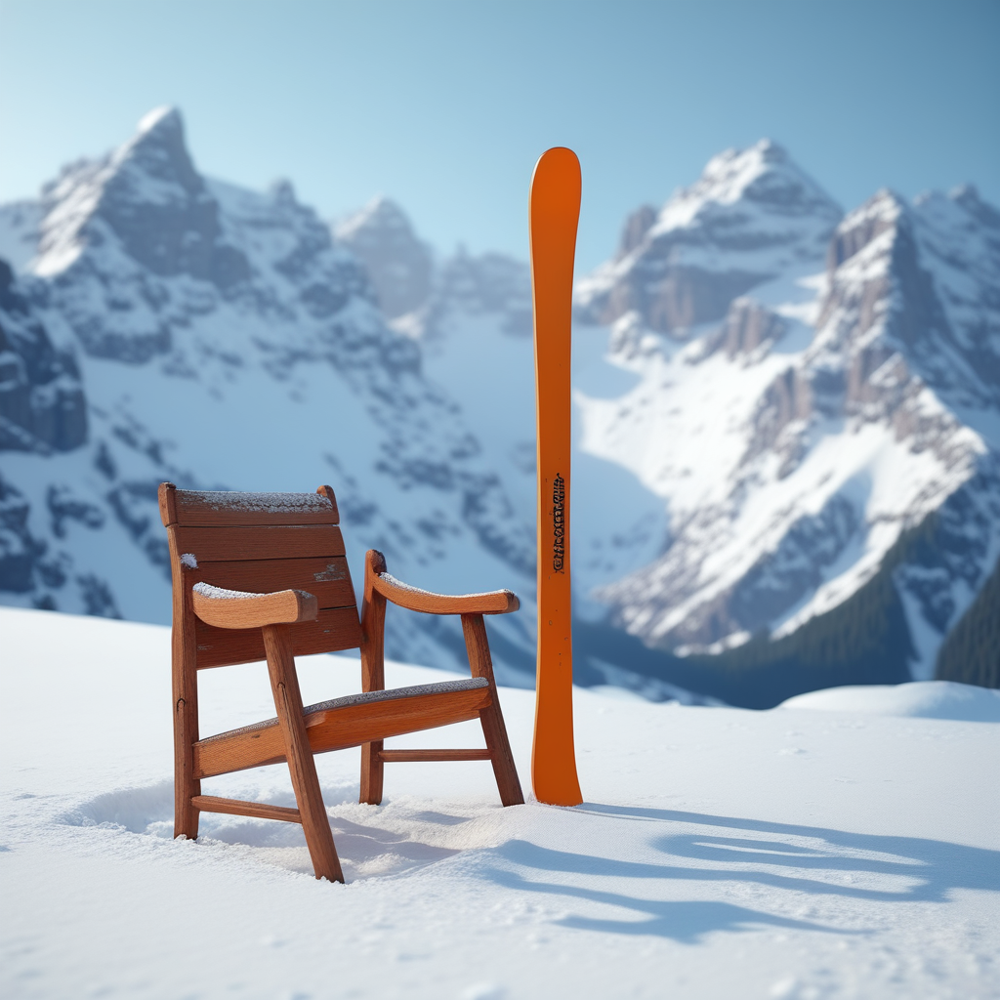

In [24]:
outputs['images'][0]

# Image Editing

In [25]:
guidance_scale = 4.0
image_guidance_scale = 1.5
cond_image_guidance_scale = 3.0

In [26]:
src_image = Image.open("examples/tool.png").convert("RGB")
instruction = "What is the tool that is used to cut fruits. Remove this tool."

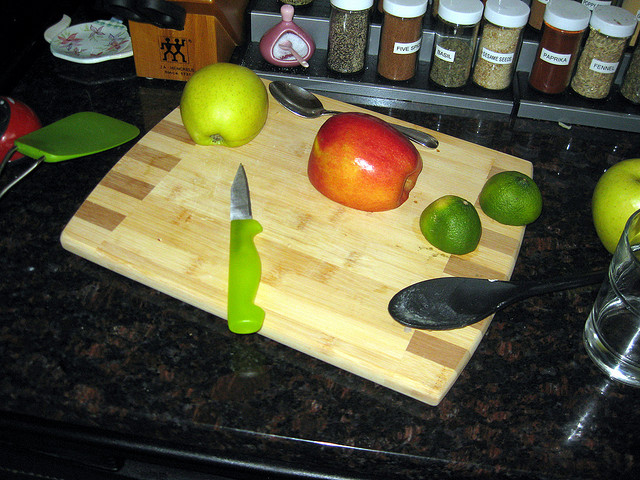

In [27]:
src_image

In [28]:
outputs = got_model.generate(text_input=instruction, 
                             image=src_image,
                             guidance_scale=guidance_scale,
                             image_guidance_scale=image_guidance_scale,
                             cond_image_guidance_scale=cond_image_guidance_scale,
                             prompt_type='edit')

100%|██████████| 50/50 [00:18<00:00,  2.77it/s]


In [29]:
print(outputs['got_text'])

1. The source image shows a kitchen countertop with a wooden cutting board on which there are two apples, a lime, and a green-handled knife. In the background, there are various spice jars and a glass of water.
2. The object to be edited is the green-handled knife.
3. The specific area to be edited is defined by the bounding box coordinates <|box_start|>(346,335),(418,701)<|box_end|> (red), which encompasses the knife.
4. Remove the green-handled knife from the image while maintaining the surrounding cutting board, apples, lime, and other elements like the spice jars and glass of water.
5. The edited image will show a kitchen countertop with a wooden cutting board on which there are two apples, a lime, and a spoon. In the background, there are various spice jars and a glass of water, with the green-handled knife removed, leaving the cutting board and other items intact.<|im_gen_start|>


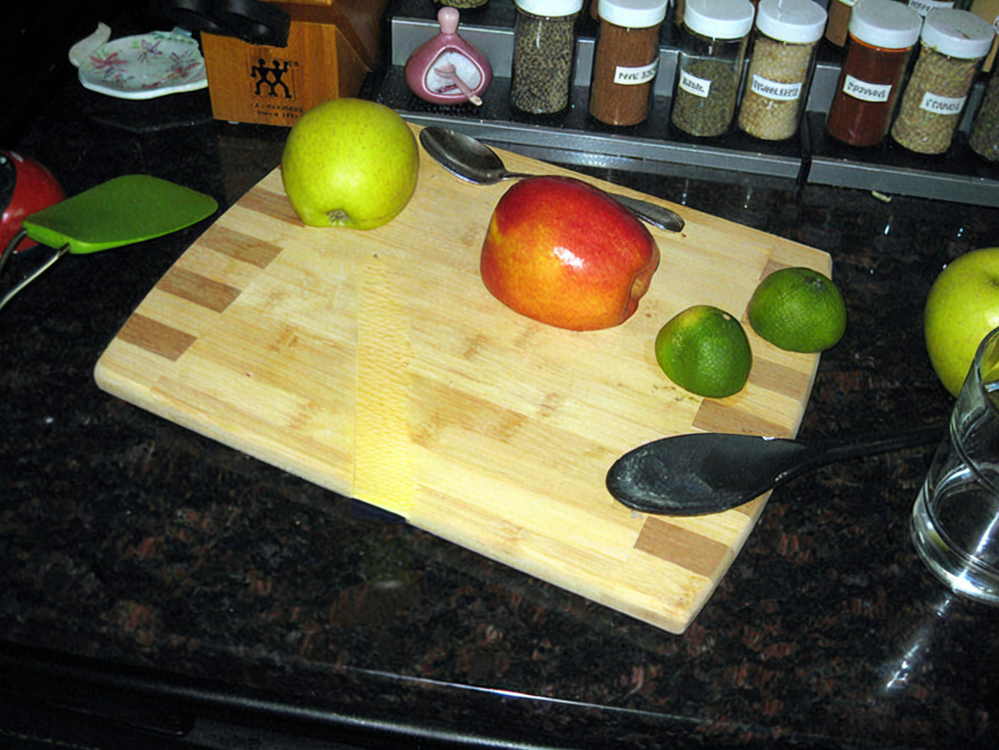

In [30]:
outputs['images'][0]

In [37]:
src_image = Image.open("examples/hat.jpg").convert("RGB")
instruction = "Add the person with a hat."

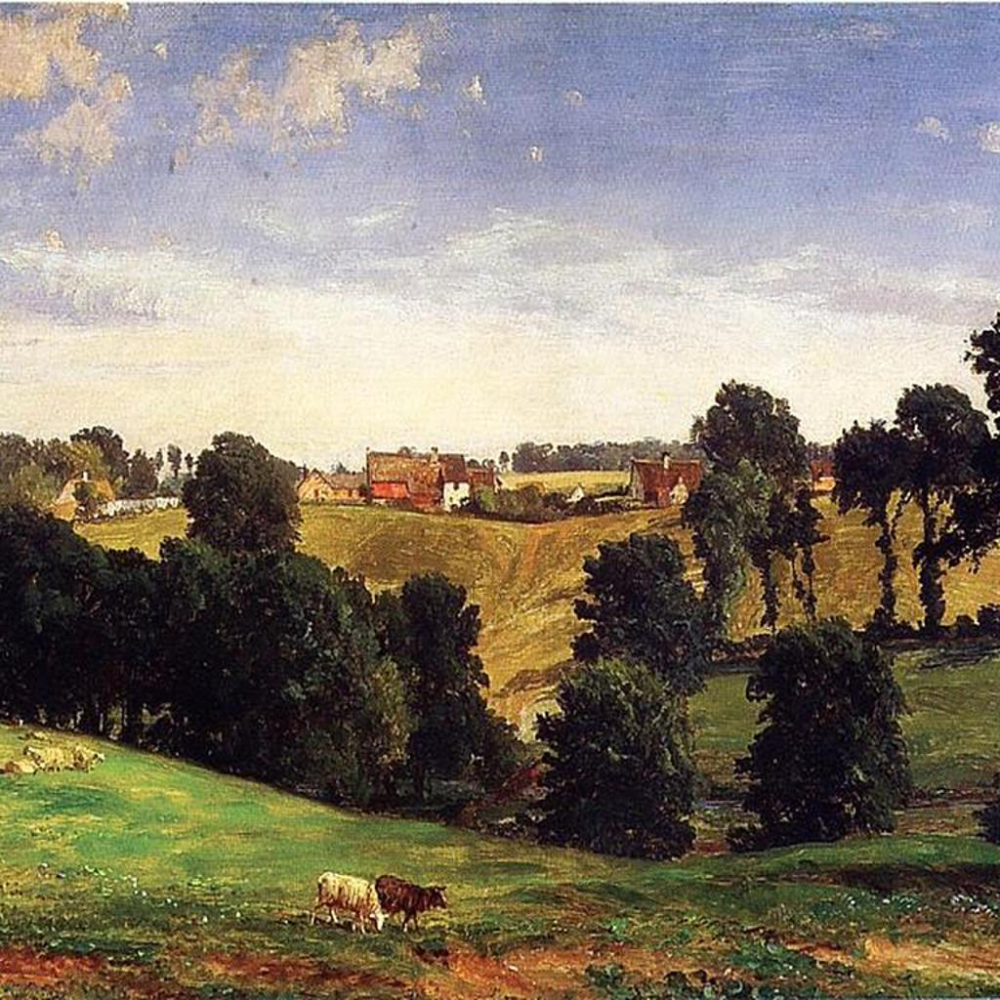

In [38]:
src_image

In [39]:
outputs = got_model.generate(text_input=instruction, 
                             image=src_image,
                             guidance_scale=guidance_scale,
                             image_guidance_scale=image_guidance_scale,
                             cond_image_guidance_scale=cond_image_guidance_scale,
                             prompt_type='edit')

100%|██████████| 50/50 [00:18<00:00,  2.76it/s]


In [40]:
print(outputs['got_text'])

1. The source image depicts a serene countryside landscape with rolling green hills, scattered trees, and a few buildings in the distance. Two cows are grazing in the foreground, and the sky is partly cloudy, adding to the tranquil atmosphere.
2. The object to be edited is a person wearing a hat and a long coat, standing in a field.
3. The specific area to be edited is defined by the bounding box coordinates <|box_start|>(865,704),(999,998)<|box_end|> (red), which encompasses the space where the person will stand.
4. Identify the specific changes to be made: Add a person wearing a hat and a long coat, positioned in the specified area, ensuring they blend naturally with the existing landscape and do not obstruct other elements.
5. The edited image will depict a serene countryside scene with lush green fields, trees, and a few buildings in the distance. A person wearing a hat and a long coat stands in the foreground, observing the tranquil landscape, seamlessly integrated into the scene.

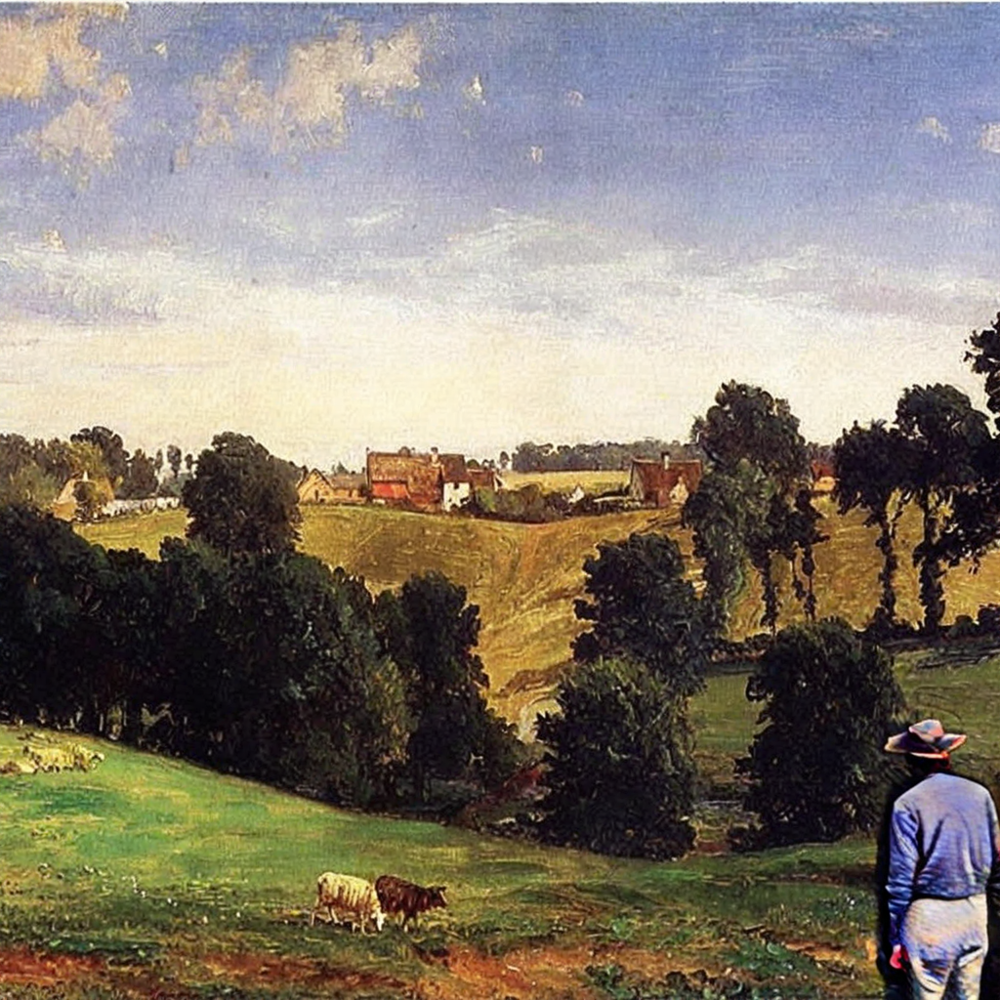

In [41]:
outputs['images'][0]

In [43]:
src_image = Image.open("examples/strawberry.jpg").convert("RGB")
instruction = "Swap the chocolate truffles with ripe, red strawberries, some with visible green leaves and one sliced open."

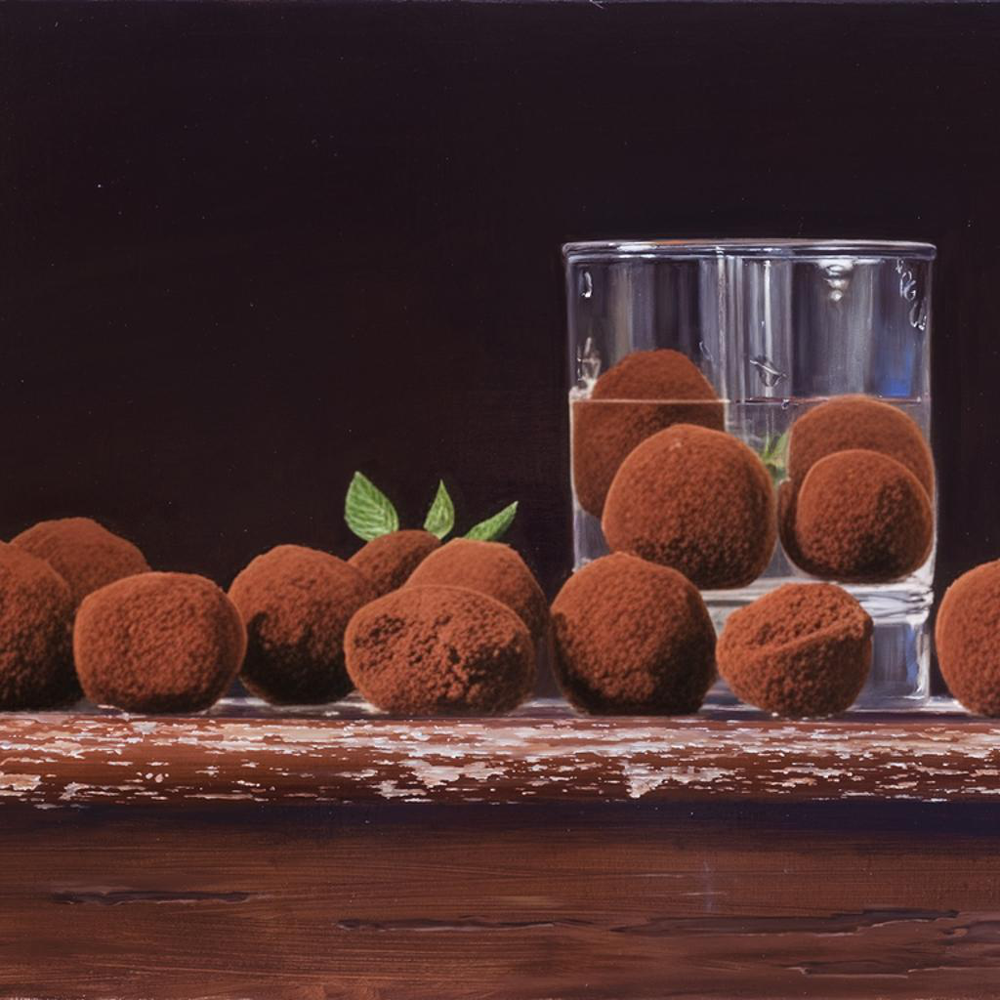

In [44]:
src_image

In [45]:
outputs = got_model.generate(text_input=instruction, 
                             image=src_image,
                             guidance_scale=guidance_scale,
                             image_guidance_scale=image_guidance_scale,
                             cond_image_guidance_scale=cond_image_guidance_scale,
                             prompt_type='edit')

100%|██████████| 50/50 [00:18<00:00,  2.75it/s]


In [46]:
print(outputs['got_text'])

1. The source image depicts a still life arrangement featuring chocolate truffles dusted with cocoa powder, a glass filled with more truffles, and a few fresh green leaves on a wooden surface. The scene is set against a dark background, highlighting the rich, dark color of the truffles and the vibrant green of the leaves.
2. The object to be edited is the chocolate truffles, specifically within the bounding box <|box_start|>(0,345),(999,728)<|box_end|> (red).
3. Identify the specific changes to be made: Replace the chocolate truffles with ripe, red strawberries, some with visible green leaves and one sliced open. The strawberries should maintain the same size and arrangement as the original truffles.
4. The edited image will feature a still life arrangement with ripe, red strawberries instead of chocolate truffles. The strawberries will be placed in the same position and arrangement as the original truffles, with some having visible green leaves and one sliced open. The glass filled wi

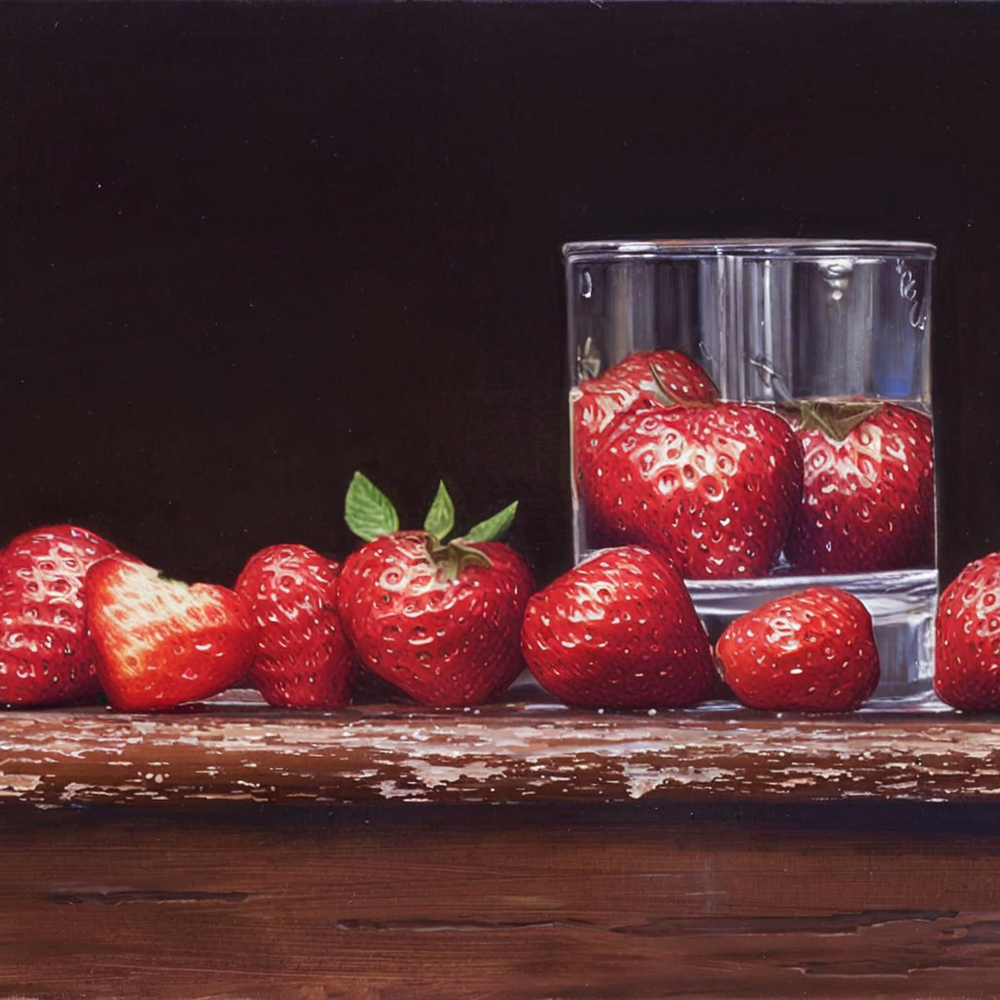

In [47]:
outputs['images'][0]